In [1]:
# importing necessary libraries and configurations
import pandas as pd
import matplotlib.pyplot as plt

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

%matplotlib inline

In [2]:
# loading the data set
df = pd.read_csv("df_45.csv")

In [3]:
# data cleaning and indexing 
df.drop("zip_code", axis=1, inplace=True)

df.occurred_date = df.occurred_date.astype("datetime64")
df.set_index(["occurred_date"], inplace=True)
df.sort_index(inplace=True)

# examining the new data frame
display(df.shape)
display(df.head())
display(df.tail())

(150513, 16)

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day
occurred_date,,,,,,,,,,,,,,,,
2003-01-01,FAILURE TO REG AS SEX OFFENDER,N,2003-02-03 11:39:00,RESIDENCE / HOME,6800 BLOCK S I 35 SB SVC RD,2.0,FR,6,C,2003-02-05 00:00:00,NaN,NaN,2003,1,1,1
2003-01-01,THEFT OF AUTO PARTS,N,2003-01-01 10:41:00,PARKING LOTS / GARAGE,409 E WILLIAM CANNON DR,2.0,FR,3,N,2003-01-03 00:00:00,30.191480,-97.775542,2003,1,1,1
2003-01-01,FAMILY DISTURBANCE,N,2003-01-01 01:14:00,RESIDENCE / HOME,2201 W WILLIAM CANNON DR,5.0,FR,1,N,2003-01-13 00:00:00,30.203443,-97.809203,2003,1,1,1
2003-01-01,CUSTODY ARREST TRAFFIC WARR,N,2003-01-01 19:12:00,STREETS / HWY / ROAD / ALLEY,5112 S 1ST ST,3.0,DA,3,C,2003-01-01 00:00:00,30.213896,-97.778061,2003,1,1,1
2003-01-01,BURGLARY OF VEHICLE,N,2003-01-01 22:11:00,PARKING LOTS / GARAGE,1701 W BEN WHITE EB SVC RD,5.0,DA,5,N,NaN,30.228146,-97.785412,2003,1,1,1


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day
occurred_date,,,,,,,,,,,,,,,,
2020-12-24,THEFT BY SHOPLIFTING,N,2020-12-24 21:19:00,CONVENIENCE STORE,W STASSNEY LN / BLUE BIRD LN,3.0,DA,3,C,2020-12-24 00:00:00,30.206220,-97.777254,2020,12,52,24
2020-12-25,ASSAULT W/INJURY-FAM/DATE VIOL,Y,2020-12-25 14:06:00,PARKING LOTS / GARAGE,6800 WEST GATE BLVD,5.0,DA,4,C,2020-12-25 00:00:00,30.209164,-97.815906,2020,12,52,25
2020-12-25,ROBBERY BY ASSAULT,N,2020-12-25 17:49:00,RESTAURANTS,1001 E BEN WHITE BLVD SVRD EB,3.0,DA,3,N,2020-12-26 00:00:00,30.216759,-97.754864,2020,12,52,25
2020-12-25,AGG ASSAULT FAM/DATE VIOLENCE,Y,2020-12-25 21:05:00,RESIDENCE / HOME,4141 S CONGRESS AVE,3.0,DA,3,C,2020-12-26 00:00:00,30.221234,-97.764493,2020,12,52,25
2020-12-26,BURGLARY OF VEHICLE,N,2020-12-26 14:11:00,PARKING LOTS / GARAGE,501 E STASSNEY LN,3.0,FR,4,NaN,NaN,30.201844,-97.771873,2020,12,52,26


In [4]:
# Creating violent crime and murder data frames for analysis
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

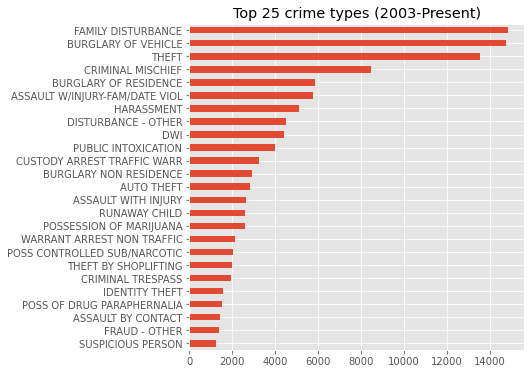

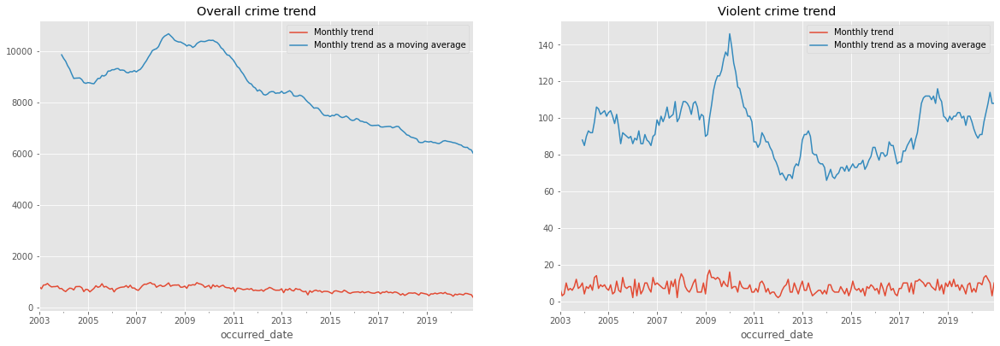

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    figsize=(6, 6), title="Top 25 crime types (2003-Present)"
)
plt.show()

fig, axs = plt.subplots(ncols=2, figsize=(20, 6.25))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(title="Overall crime trend", ax=axs[0])
axs[0].legend(["Monthly trend", "Monthly trend as a moving average"])
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", ax=axs[1]
)
axs[1].legend(["Monthly trend", "Monthly trend as a moving average"])
plt.show()

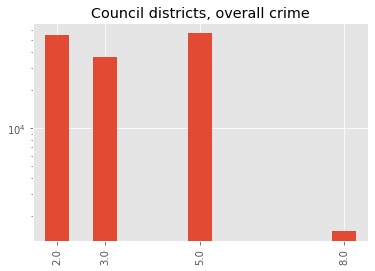

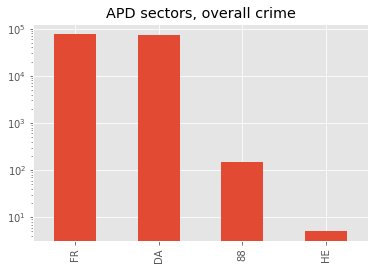

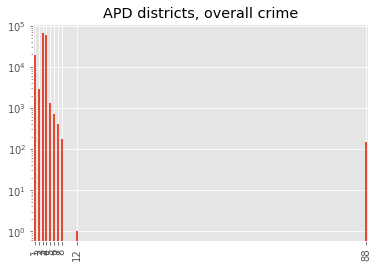

In [6]:
# Showing overall crime rates by council districts, APD districts, and sectors
df.council_district.value_counts().plot.bar(
    title="Council districts, overall crime", logy=True
)
plt.show()


df.apd_sector.value_counts().plot.bar(title="APD sectors, overall crime", logy=True)
plt.show()


df.apd_district.value_counts().plot.bar(title="APD districts, overall crime", logy=True)
plt.show()

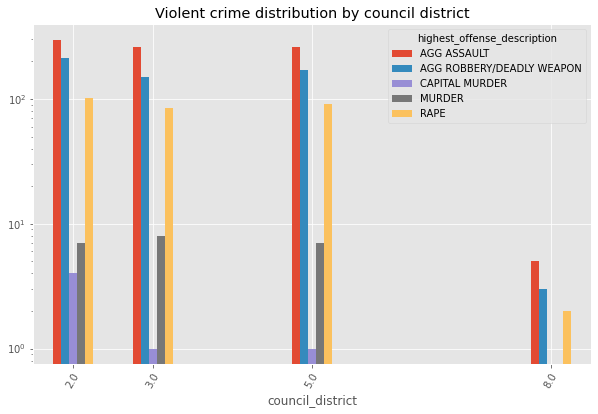

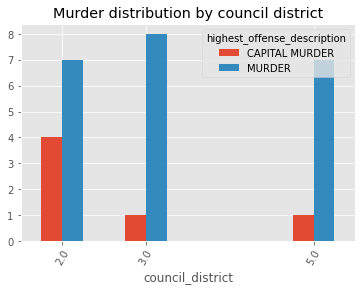

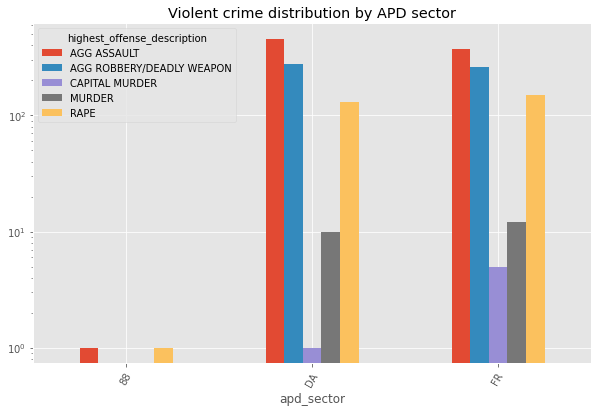

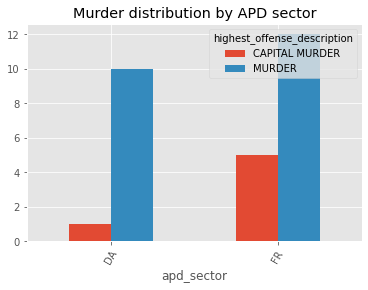

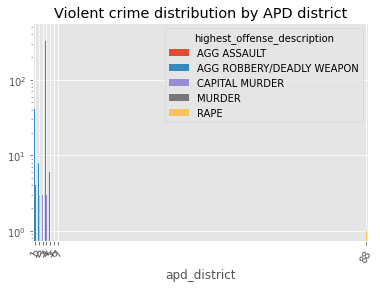

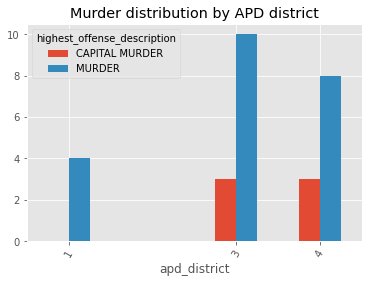

In [11]:
pd.crosstab(df_viol.council_district, df_viol.highest_offense_description).plot.bar(
    rot=60, 
    figsize=(10, 6.25), 
    title="Violent crime distribution by council district", 
    logy=True,
)
plt.show()

pd.crosstab(
    df_viol_mur.council_district, df_viol_mur.highest_offense_description
).plot.bar(rot=60, title="Murder distribution by council district")
plt.show()

pd.crosstab(df_viol.apd_sector, df_viol.highest_offense_description).plot.bar(
    rot=60, figsize=(10, 6.25), logy=True, title="Violent crime distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol_mur.apd_sector, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol.apd_district, df_viol.highest_offense_description).plot.bar(
    rot=60,
    # figsize=(10, 6.25),
    logy=True,
    title="Violent crime distribution by APD district",
)
plt.show()

pd.crosstab(df_viol_mur.apd_district, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD district"
)
plt.show()

highest_offense_description,AGG ASSAULT,AGG ROBBERY/DEADLY WEAPON,CAPITAL MURDER,MURDER,RAPE
location_type,,,,,
ATM SEPARATE FROM BANK,0,1,0,0,0
AUTO DEALERSHIP NEW / USED,2,0,0,0,0
BANKS / SAVINGS & LOAN,0,19,0,0,0
BAR / NIGHT CLUB,30,3,1,1,4
CAMP / CAMPGROUND,2,0,0,0,1
CHURCH / SYNAGOGUE / TEMPLE / MOSQUE,1,1,0,0,1
COMMERCIAL / OFFICE BUILDING,17,67,0,1,3
COMMUNITY CENTER,0,0,0,0,1
CONVENIENCE STORE,11,56,0,0,0


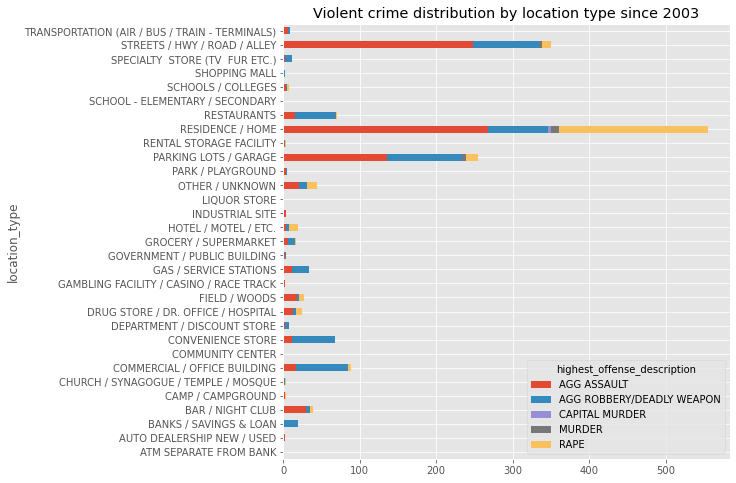

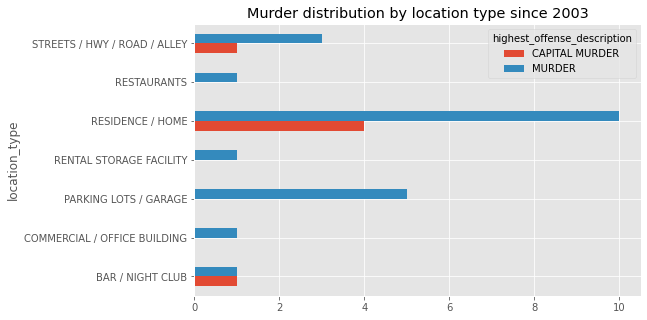

In [8]:
viol_loc = pd.crosstab(df_viol.location_type, df_viol.highest_offense_description)
display(viol_loc)

mur_loc = pd.crosstab(
    df_viol_mur.location_type, df_viol_mur.highest_offense_description
)

viol_loc.plot.barh(
    figsize=(8, 8),
    title="Violent crime distribution by location type since 2003",
    stacked=True,
)
plt.show()

mur_loc.plot.barh(
    figsize=(8, 5), title="Murder distribution by location type since 2003"
)
plt.show()

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


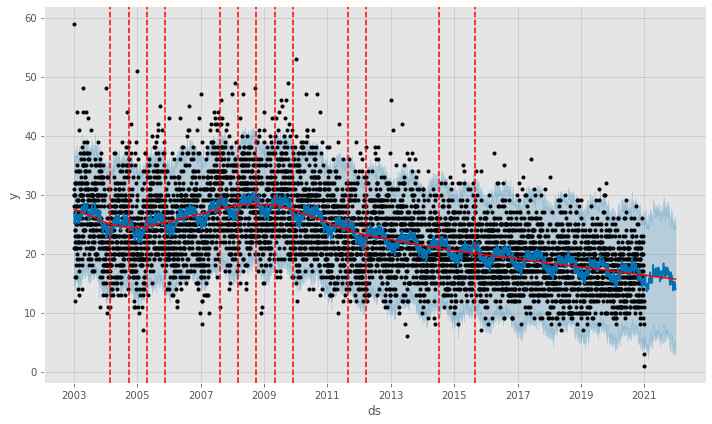

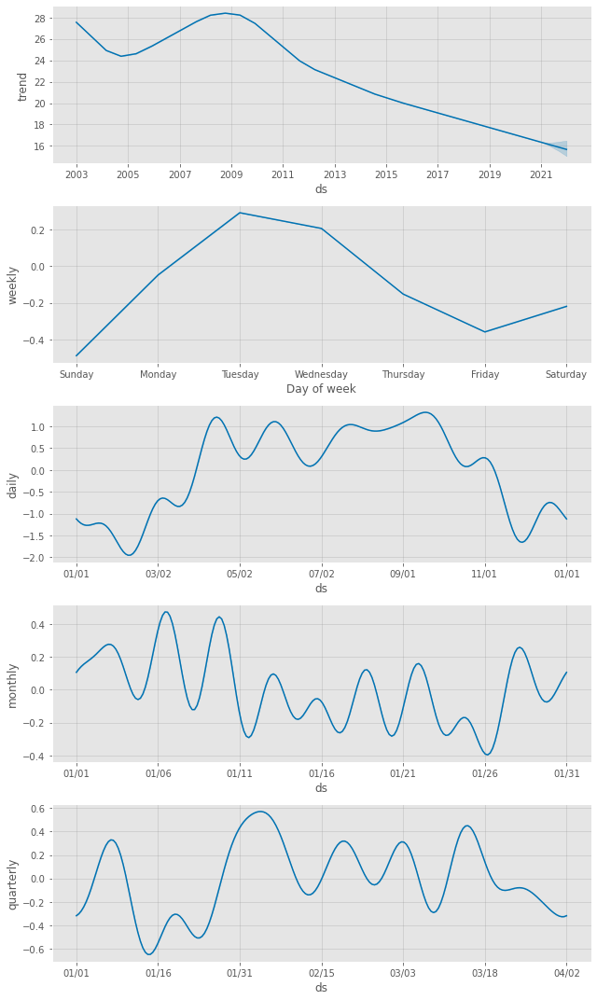

In [9]:
# forecasting for overall crime
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)
fig2_1 = plot_plotly(m, forecast)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


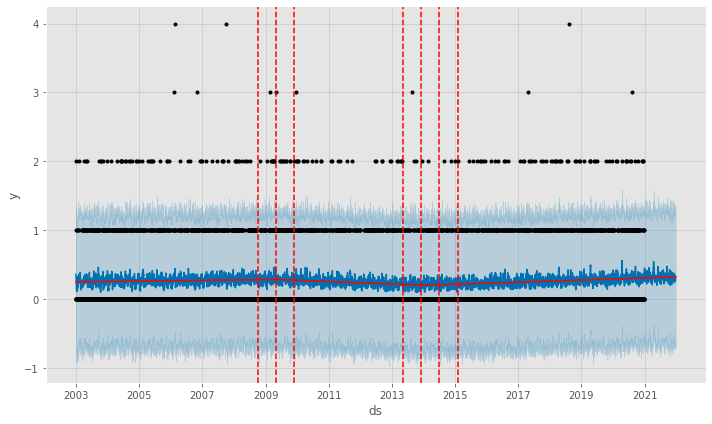

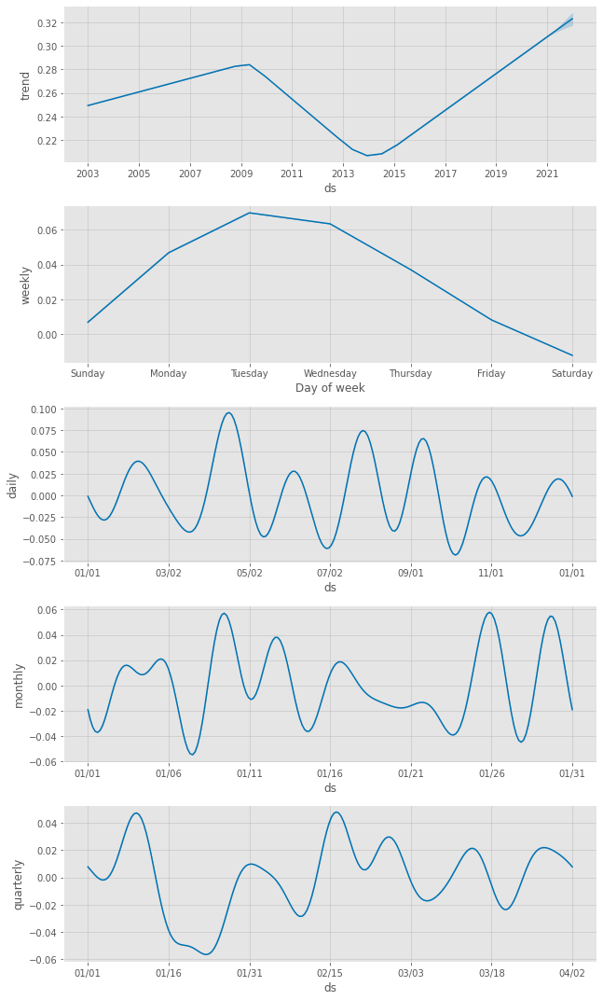

In [10]:
# forecasting for violent crime 
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
forecast = n.predict(future)

fig = n.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), n, forecast)

fig3 = n.plot_components(forecast)
fig3_1 = plot_plotly(n, forecast)
fig3_1